<a href="https://colab.research.google.com/github/dddddyoung2/P4-Neural-Style-Transfer/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Style Transfer

: 딥러닝을 사용하여 원하는 이미지를 다른 스타일의 이미지로 구성하는 것을 말한다.

- 케라스 창시자에게 배우는 딥러닝 책의 8장 3절의 코드를 응용했다.
- 뉴럴 스타일 트랜스퍼 로 2015년 리온 게티스에 의해 ‘A Neural Algorithm of Artistic Style ’ 논문으로 처음 세상에 알려졌다.
- 타겟 이미지의 콘텐츠는 보존하면서 참조 이미지의 스타일을 타겟 이미지에 적용하는 방식이다.
- 스타일: 질감, 색깔, 이미지 등 다양한 크기의 시각 요소 의미
- 프리즈마 등 스마트폰의 사진 앱에도 쓰임

- CNN과 차이
  - CNN을 사용하지만, CNN을 어떻게 사용하는지에 대한 접근이 다름

- Image-net 등의 데이터로 미리 학습된(pre-trained) 네트워크를 이용한 방법
  - Content image와 style image를 네트워크에 통과시킬 때 나온 각각의 feature map을 저장하고, 새롭게 합성될 영상의 feature map이 content image와 style image로부터 나온 feature map과 비슷한 특성을 가지도록 영상을 최적화한다.
  - 장점: 이미지 2장(content image & style image)으로 style transfer가 가능하다.
  - 단점: 매번 이미지를 새롭게 최적화 해야 하므로 시간이 오래걸린다.

- GAN을 이용해서도 가능함

 단 2장의 이미지로 어느 정도까지 수행할 수 있을까?

가설: 스타일 이미지의 색감과 구도는 이미지 변환에 영향을 줄 것이다.

Check!(확인 해 볼 것)
1. 이미지 반복 학습에 따른 변화 비교
2. 인물-인물, 배경-배경, 배경-인물, 인물-배경 비교
3. 전혀 다른 스타일의 이미지도 변환이 가능한가?
4. 애니메이션 스타일 이미지로 변환이 가능한가?

In [1]:
from tensorflow import keras
keras.__version__

'2.5.0'

In [2]:
# keras 버전 낮추기
!pip uninstall tensorflow

#// Proceed (y/n)? 나오면 y입력

Uninstalling tensorflow-2.5.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/import_pb_to_tensorboard
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.7/dist-packages/tensorflow-2.5.0.dist-info/*
    /usr/local/lib/python3.7/dist-packages/tensorflow/*
Proceed (y/n)? y
  Successfully uninstalled tensorflow-2.5.0


In [3]:
!pip install tensorflow==2.4.0

#//RESTART RUNTIME 클릭 d

     |████████████████████████████████| 394.7MB 45kB/s 
     |████████████████████████████████| 3.8MB 35.3MB/s 
     |████████████████████████████████| 471kB 44.9MB/s 
     |████████████████████████████████| 2.9MB 39.7MB/s 
  Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
  Found existing installation: grpcio 1.34.1
    Uninstalling grpcio-1.34.1:
      Successfully uninstalled grpcio-1.34.1
  Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
  Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0


In [1]:
# 설치 후 버전\ 확인
from tensorflow import keras
keras.__version__

'2.4.0'

In [2]:
import tensorflow as tf

tf.compat.v1.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
# GPU 사용 확인
import torch
use_cuda = torch.cuda.is_available()
print(use_cuda)

True


- 고화질 이미지로 진행, iteration 10, 50, 100번 진행 비교


### 이미지 업로드

In [4]:
# #구글 드라이브에서 가져오기
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('user uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))

Saving 1_test.jpg to 1_test.jpg
Saving 2_test.jpg to 2_test.jpg
Saving 3_Andy_Warhol_car.jpg to 3_Andy_Warhol_car.jpg
Saving 4_test.jpg to 4_test.jpg
Saving 4_Vincent_van_Gogh_hat_500.jpg to 4_Vincent_van_Gogh_hat_500.jpg
Saving 5_monet_sea_1280.jpg to 5_monet_sea_1280.jpg
Saving 5_test.jpg to 5_test.jpg
Saving 6_bts_t_2.jpg to 6_bts_t_2.jpg
Saving 6_howl_2.JPG to 6_howl_2.JPG
Saving 7_Renoir_people.jpg to 7_Renoir_people.jpg
Saving 7_test.jpg to 7_test.jpg
Saving 8_test.jpg to 8_test.jpg
Saving 8_winter_4.jpg to 8_winter_4.jpg
Saving 9_IU_3.jpg to 9_IU_3.jpg
Saving 9_winter_2.jpg to 9_winter_2.jpg
Saving 10_IU_6.jpg to 10_IU_6.jpg
Saving 10_Renoir_samary.jpg to 10_Renoir_samary.jpg
Saving bts_t_1.jpg to bts_t_1.jpg
Saving gustav_lady.jpg to gustav_lady.jpg
Saving IU_1.jpg to IU_1.jpg
Saving IU_2.jpg to IU_2.jpg
Saving IU_4.jpg to IU_4.jpg
Saving IU_5.jpg to IU_5.jpg
Saving mucha_lady.jpg to mucha_lady.jpg
Saving Renoir_lady.jpg to Renoir_lady.jpg
Saving Renoir_sisters.jpg to Renoir_si

In [73]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img

# 변환하려는 이미지 경로
target_image_path = './2_test.jpg'
# 스타일 이미지 경로
style_reference_image_path = './3_Andy_Warhol_car.jpg'

# 생성된 사진의 차원
width, height = load_img(target_image_path).size
img_height = 400 #가로사진: 400, 세로사진: 600
img_width = int(width * img_height / height) #비율에 맞춰서 줄여줌

- 이미지의 높이를 400으로 고정시키고 비율이 맞게끔 너비로 변환해줌

### VGG19
- 사전 훈련된 컨브넷
- VGG19에 이미지 로드, 전처리, 사후 처리를 위한 함수 정의함

In [74]:
import numpy as np
from tensorflow.keras.applications import vgg19

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_height, img_width))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

def deprocess_image(x):
    # ImageNet의 평균 픽셀 값을 더합니다
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

cf) OpenCV는 RGB의 반대의 순서인 BGR로 표현함
  - RGB: 빨강, 초록, 파랑으로 0~255로 표시하며 값이 커질수록 해당 색상의 빛이 밝아지는 원리

#### VGG19 네트워크 설정

In [75]:
from tensorflow.keras import backend as K

target_image = K.constant(preprocess_image(target_image_path))
style_reference_image = K.constant(preprocess_image(style_reference_image_path))

# 생성된 이미지를 담을 플레이스홀더
combination_image = K.placeholder((1, img_height, img_width, 3))

# 세 개의 이미지를 하나의 배치로 합칩니다
input_tensor = K.concatenate([target_image,
                              style_reference_image,
                              combination_image], axis=0)

# 세 이미지의 배치를 입력으로 받는 VGG 네트워크를 만듭니다.
# 이 모델은 사전 훈련된 ImageNet 가중치를 로드합니다
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet',
                    include_top=False)
print('모델 로드 완료.')

모델 로드 완료.


## 손실 함수 정의

#### 콘텐츠 손실
- 콘텐츠 손실 정의:
  - VGG19 컨브넷의 상위 층은 타깃 이미지와 생성된 이미지를 동일하게 바라봐야 함


In [76]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))

#### 스타일 손실
- 유틸리티 함수를 사용해 입력 행렬의 그람 행렬을 계산. 이 행렬은 원본 특성 행렬의 상관관계를 기록한 행렬

In [77]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_height * img_width
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

#### 손실함수 추가(변위 손실)
  - 생성된 이미지의 픽셀을 사용하여 계산
  - 생성된 이미지가 공간적인 연속성을 가지도록 도와주며 픽셀의 격자 무늬가 과도하게 나타나는 것을 막아줌
  - 일종의 규제

In [78]:
def total_variation_loss(x):
    a = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, 1:, :img_width - 1, :])
    b = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, :img_height - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))

### 최소화할 최종 손실 정의
  - 앞의 세 개의 손실의 가중치 평균
  - 콘텐츠 손실은 block5_conv2 층 하나만 사용해 계산
  - 스타일 손실은 하위 층과 상위 층에 걸쳐 여러 층을 사용해야 함 
  - 마지막에 변위 손실 추가해줌
  - content_weight : 생성된 이미지에 타깃 콘텐츠가 얼마나 나타나는지 조정함 크기가 클 수록 더 많이 나타나게 됨

In [79]:
# 층 이름과 활성화 텐서를 매핑한 딕셔너리
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
# 콘텐츠 손실에 사용할 층
content_layer = 'block5_conv2'
# 스타일 손실에 사용할 층
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']
# 손실 항목의 가중치 평균에 사용할 가중치
total_variation_weight = 1e-4 # 30 했을 때, content 이미지가 많이 사라지는 현상 
style_weight = 1.
content_weight = 0.025

# 모든 손실 요소를 더해 하나의 스칼라 변수로 손실을 정의합니다
loss = K.variable(0.)
layer_features = outputs_dict[content_layer]
target_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(target_image_features,
                                      combination_features)
for layer_name in style_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(style_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

### 경사 하강법 단계 설정
- L-BFGS 알고리즘 사용해 최적화 수행(게티스 논문에서 사용함)
  - L-BFGS 알고리즘 제약 사항:
    - 손실 함수의 값과 그래디언트 값을 별개의 함수로 전달해야 함
    - 이 함수는 3D 이미지 배열이 아니라 1차원 벡터만 처리할 수 있음

- 하지만, 손실 함수의 값과 그래디언트 값을 따로 계산하는 것은 비효율적임
  - 두 계산 사이에 중복되는 계산이 많이 때문에 한번에 계산하는 것보다 두 배 느림

- 그래서 손실과 그래디언트 값을 동시에 계산하는 Evaluator라는 이름의 파이썬 클래스 만듬
  - 처음 호출할 때 손실 값을 반환하면서 다음 호출을 위해 그래디언트를 캐싱함


In [80]:
# 손실에 대한 생성된 이미지의 그래디언트를 구합니다
grads = K.gradients(loss, combination_image)[0]

# 현재 손실과 그래디언트의 값을 추출하는 케라스 Function 객체입니다
fetch_loss_and_grads = K.function([combination_image], [loss, grads])


class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        x = x.reshape((1, img_height, img_width, 3))
        outs = fetch_loss_and_grads([x])
        loss_value = outs[0]
        grad_values = outs[1].flatten().astype('float64')
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

evaluator = Evaluator()

In [81]:
# 100번 반복시
from scipy.optimize import fmin_l_bfgs_b
import time

result_prefix = 'style_transfer_result'
iterations = 100

# 뉴럴 스타일 트랜스퍼의 손실을 최소화하기 위해 생성된 이미지에 대해 L-BFGS 최적화를 수행합니다
# 초기 값은 타깃 이미지입니다
# scipy.optimize.fmin_l_bfgs_b 함수가 벡터만 처리할 수 있기 때문에 이미지를 펼칩니다.
x = preprocess_image(target_image_path)
x = x.flatten()
for i in range(iterations):
    print('반복 횟수:', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x,
                                     fprime=evaluator.grads, maxfun=20)
    print('현재 손실 값:', min_val)
    # 생성된 현재 이미지를 저장합니다
    img = x.copy().reshape((img_height, img_width, 3))
    img = deprocess_image(img)
    fname = result_prefix + '_at_iteration_%d.png' % i
    save_img(fname, img)
    end_time = time.time()
    print('저장 이미지: ', fname)
    print('%d 번째 반복 완료: %ds' % (i, end_time - start_time))

반복 횟수: 0
현재 손실 값: 10787194000.0
저장 이미지:  style_transfer_result_at_iteration_0.png
0 번째 반복 완료: 12s
반복 횟수: 1
현재 손실 값: 5251996700.0
저장 이미지:  style_transfer_result_at_iteration_1.png
1 번째 반복 완료: 6s
반복 횟수: 2
현재 손실 값: 3672878300.0
저장 이미지:  style_transfer_result_at_iteration_2.png
2 번째 반복 완료: 6s
반복 횟수: 3
현재 손실 값: 2962891300.0
저장 이미지:  style_transfer_result_at_iteration_3.png
3 번째 반복 완료: 7s
반복 횟수: 4
현재 손실 값: 2514454500.0
저장 이미지:  style_transfer_result_at_iteration_4.png
4 번째 반복 완료: 6s
반복 횟수: 5
현재 손실 값: 2213902000.0
저장 이미지:  style_transfer_result_at_iteration_5.png
5 번째 반복 완료: 7s
반복 횟수: 6
현재 손실 값: 1994953500.0
저장 이미지:  style_transfer_result_at_iteration_6.png
6 번째 반복 완료: 7s
반복 횟수: 7
현재 손실 값: 1836790800.0
저장 이미지:  style_transfer_result_at_iteration_7.png
7 번째 반복 완료: 7s
반복 횟수: 8
현재 손실 값: 1684519400.0
저장 이미지:  style_transfer_result_at_iteration_8.png
8 번째 반복 완료: 7s
반복 횟수: 9
현재 손실 값: 1552681300.0
저장 이미지:  style_transfer_result_at_iteration_9.png
9 번째 반복 완료: 7s
반복 횟수: 10
현재 손실 값: 1462036100.0
저장 이미지

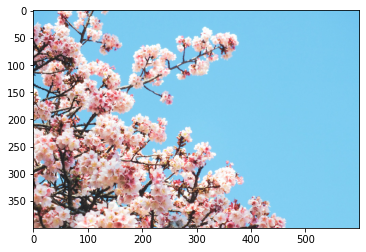

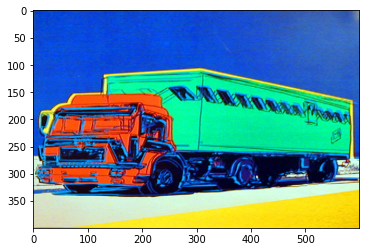

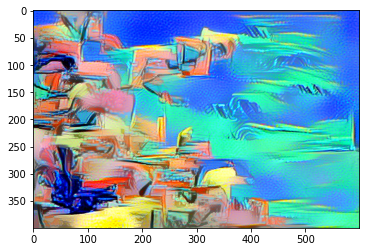

In [82]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

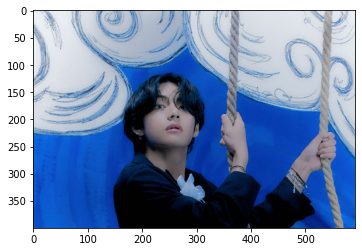

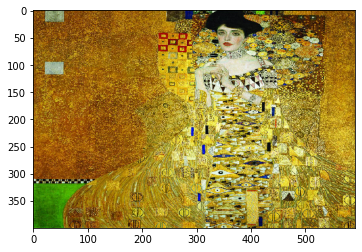

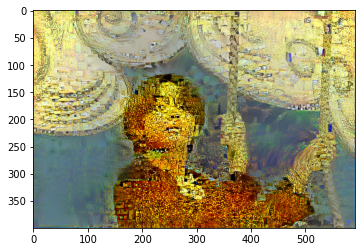

In [72]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

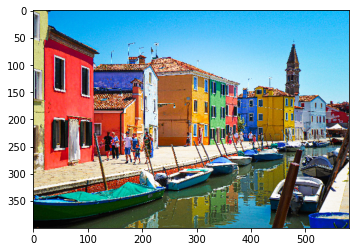

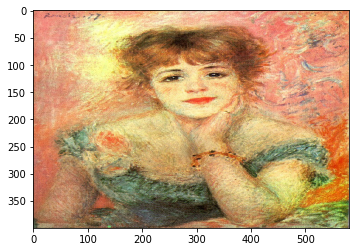

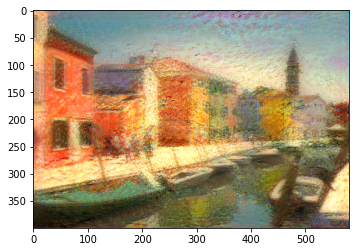

In [62]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

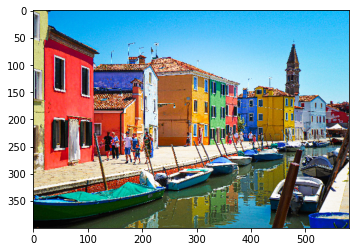

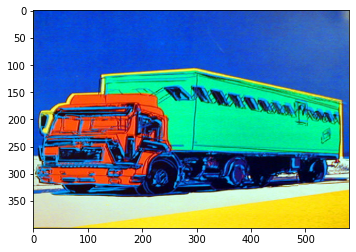

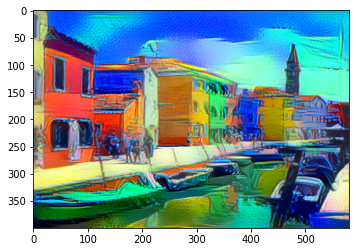

In [52]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

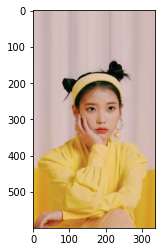

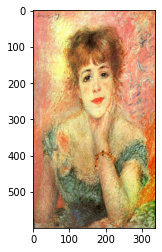

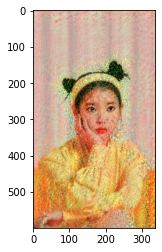

In [42]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

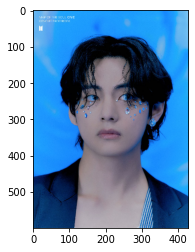

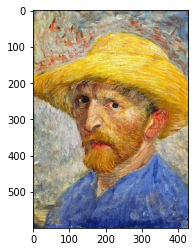

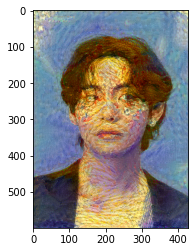

In [29]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

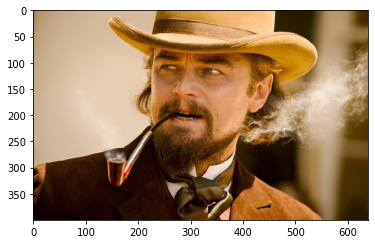

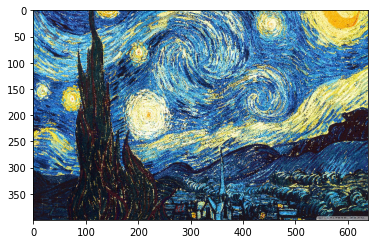

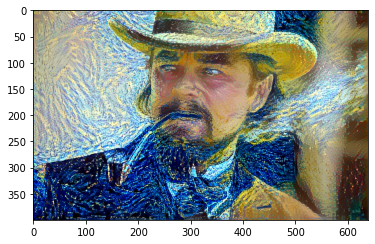

In [18]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

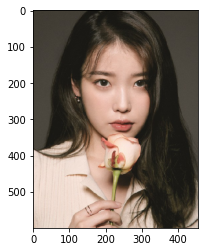

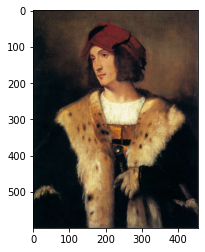

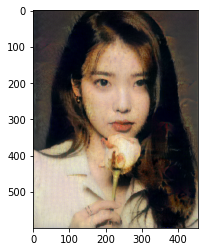

In [145]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

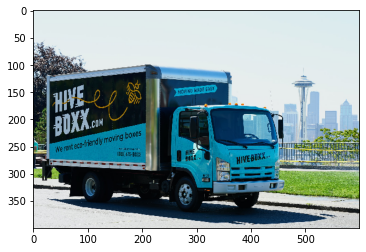

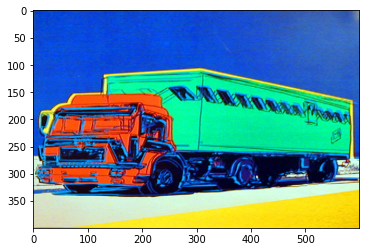

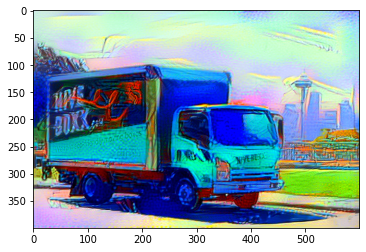

In [ ]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

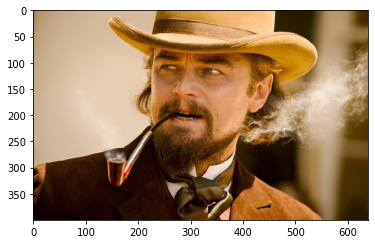

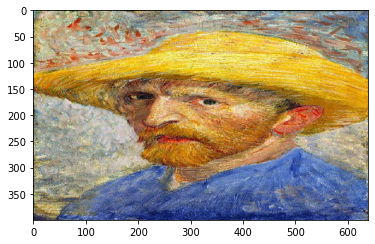

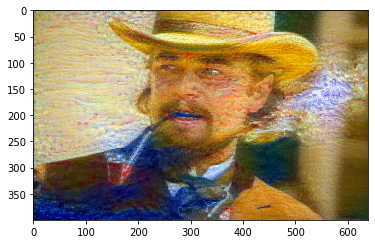

In [46]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

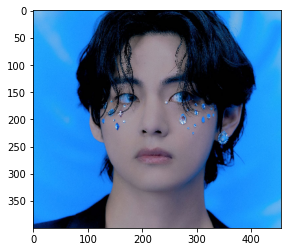

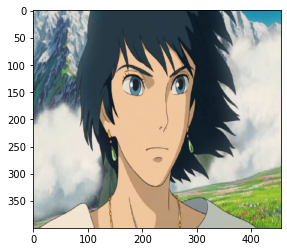

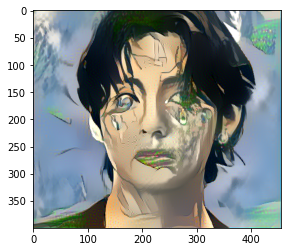

In [73]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

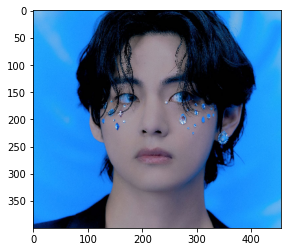

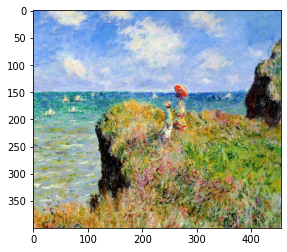

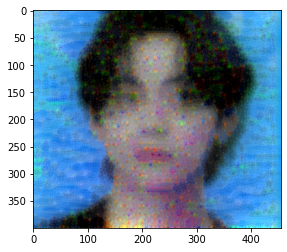

In [84]:
# total 가중치 30
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

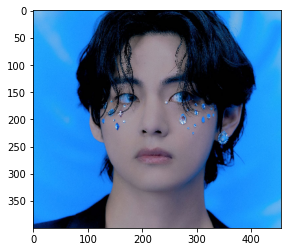

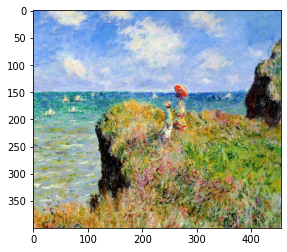

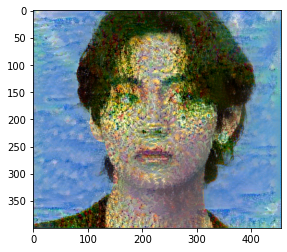

In [88]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

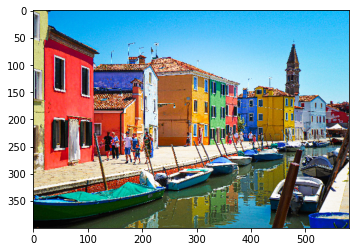

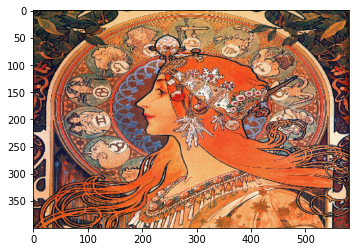

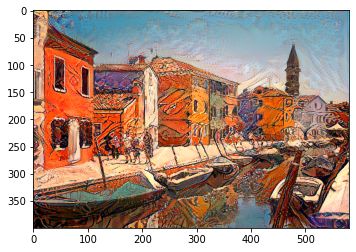

In [98]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

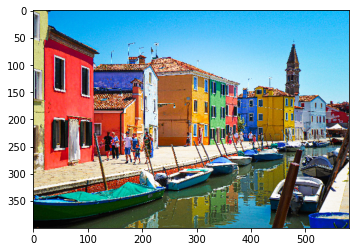

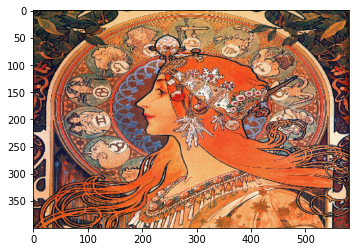

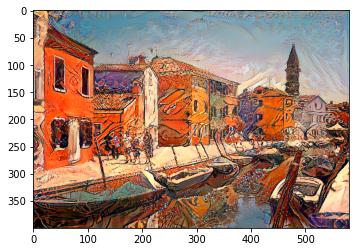

In [100]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

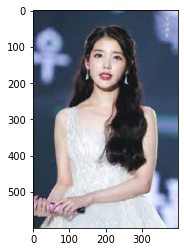

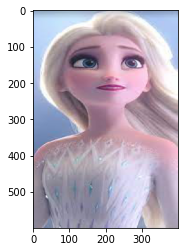

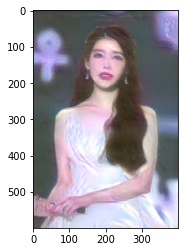

In [124]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

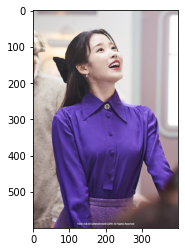

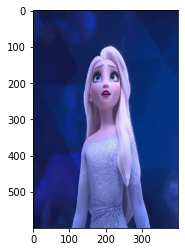

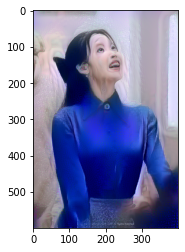

In [135]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

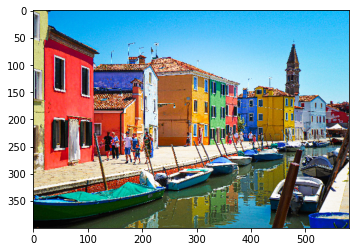

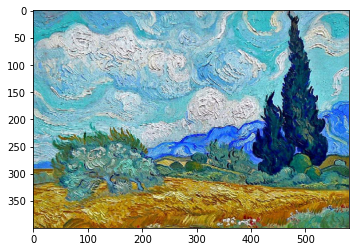

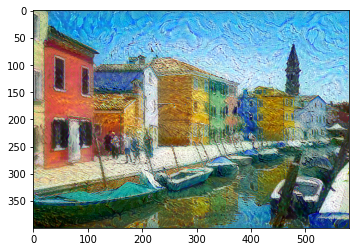

In [ ]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()

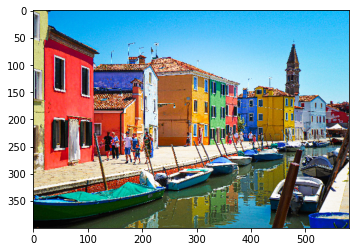

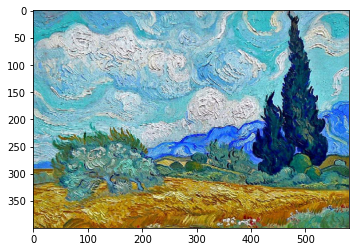

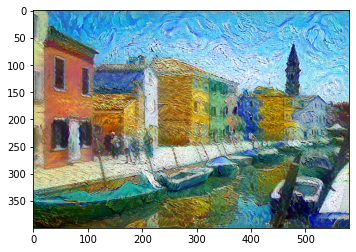

In [ ]:
from matplotlib import pyplot as plt

# 콘텐츠 이미지
plt.imshow(load_img(target_image_path, target_size=(img_height, img_width)))
plt.figure()

# 스타일 이미지
plt.imshow(load_img(style_reference_image_path, target_size=(img_height, img_width)))
plt.figure()

# 생성된 이미지
plt.imshow(img)
plt.show()



---



---



In [ ]:
total_variation_weight2=30

In [ ]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [ ]:
content_image= load_img(target_image_path)
image = tf.Variable(content_image)

In [ ]:
extractor = StyleContentModel(style_layers, content_layer)

results = extractor(tf.constant(content_image))

NameError: ignored

In [ ]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("훈련 스텝: {}".format(step))

end = time.time()
print("전체 소요 시간: {:.1f}".format(end-start))

NameError: ignored